In [4]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import plotly.express as px
import folium

In [5]:
data = pd.read_csv('Daily_data_of_reservoir_level_of_Central_Water_Commission_(CWC)_Agency_during_March_2024.csv')

In [6]:
data.head(10)

,Reservoir_name,Basin,Subbasin,Agency_name,Lat,Long,Date,Year,Month,Full_reservoir_level,Live_capacity_FRL,Storage,Level
0,Aliyar Reservoir,West flowing rivers from Tadri to Kanyakumari ...,Varrar and others,CWC,10.472668,76.974597,2024-03-01,2024,3,320.04,0.095,0.00810,303.505
1,Aliyar Reservoir,West flowing rivers from Tadri to Kanyakumari ...,Varrar and others,CWC,10.472668,76.974597,2024-03-02,2024,3,320.04,0.095,0.00755,303.352
2,Aliyar Reservoir,West flowing rivers from Tadri to Kanyakumari ...,Varrar and others,CWC,10.472668,76.974597,2024-03-03,2024,3,320.04,0.095,NaN,NaN
3,Aliyar Reservoir,West flowing rivers from Tadri to Kanyakumari ...,Varrar and others,CWC,10.472668,76.974597,2024-03-04,2024,3,320.04,0.095,0.00669,303.093
4,Aliyar Reservoir,West flowing rivers from Tadri to Kanyakumari ...,Varrar and others,CWC,10.472668,76.974597,2024-03-05,2024,3,320.04,0.095,0.00621,302.941
5,Aliyar Reservoir,West flowing rivers from Tadri to Kanyakumari ...,Varrar and others,CWC,10.472668,76.974597,2024-03-06,2024,3,320.04,0.095,0.00601,302.880
6,Aliyar Reservoir,West flowing rivers from Tadri to Kanyakumari ...,Varrar and others,CWC,10.472668,76.974597,2024-03-07,2024,3,320.04,0.095,0.00582,302.819
7,Aliyar Reservoir,West flowing rivers from Tadri to Kanyakumari ...,Varrar and others,CWC,10.472668,76.974597,2024-03-08,2024,3,320.04,0.095,0.00563,302.758
8,Aliyar Reservoir,West flowing rivers from Tadri to Kanyakumari ...,Varrar and others,CWC,10.472668,76.974597,2024-03-09,2024,3,320.04,0.095,0.00539,302.682
9,Aliyar Reservoir,West flowing rivers from Tadri to Kanyakumari ...,Varrar and others,CWC,10.472668,76.974597,2024-03-10,2024,3,320.04,0.095,0.00630,302.971


In [7]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3689 entries, 0 to 3688
Data columns (total 13 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Reservoir_name        3689 non-null   object 
 1   Basin                 3689 non-null   object 
 2   Subbasin              3689 non-null   object 
 3   Agency_name           3689 non-null   object 
 4   Lat                   3689 non-null   float64
 5   Long                  3689 non-null   float64
 6   Date                  3689 non-null   object 
 7   Year                  3689 non-null   int64  
 8   Month                 3689 non-null   int64  
 9   Full_reservoir_level  3689 non-null   float64
 10  Live_capacity_FRL     3689 non-null   float64
 11  Storage               2578 non-null   float64
 12  Level                 2596 non-null   float64
dtypes: float64(6), int64(2), object(5)
memory usage: 374.8+ KB


In [8]:
data.describe()

,Lat,Long,Year,Month,Full_reservoir_level,Live_capacity_FRL,Storage,Level
count,3689.000000,3689.000000,3689.0,3689.0,3689.000000,3689.000000,2578.000000,2596.000000
mean,19.728165,77.436575,2024.0,3.0,398.518319,1.409464,0.427417,408.343594
std,5.183895,4.439938,0.0,0.0,241.598515,1.825011,0.535977,234.593849
min,8.920001,70.403043,2024.0,3.0,55.000000,0.006000,0.000060,47.730000
25%,16.317208,73.904185,2024.0,3.0,169.000000,0.288000,0.136277,188.422500
50%,20.184219,76.489168,2024.0,3.0,359.660000,0.664000,0.226185,389.008500
75%,23.073705,79.181634,2024.0,3.0,594.360000,1.711000,0.526715,599.635000
max,32.484470,94.295566,2024.0,3.0,1002.790000,9.745000,5.233000,970.380000


In [9]:
data.isnull().sum(axis=0)

Reservoir_name             0
Basin                      0
Subbasin                   0
Agency_name                0
Lat                        0
Long                       0
Date                       0
Year                       0
Month                      0
Full_reservoir_level       0
Live_capacity_FRL          0
Storage                 1111
Level                   1093
dtype: int64

In [10]:
data['Storage'].fillna(data['Storage'].median(),inplace=True)
data['Level'].fillna(data['Level'].mean(),inplace=True)

data['Date'] = pd.to_datetime(data['Date'])

In [32]:
data.dtypes

Reservoir_name                  object
Basin                           object
Subbasin                        object
Agency_name                     object
Lat                            float64
Long                           float64
Date                    datetime64[ns]
Year                             int64
Month                            int64
Full_reservoir_level           float64
Live_capacity_FRL              float64
Storage                        float64
Level                          float64
Normalized_Storage             float64
dtype: object

In [11]:
data.isnull().sum(axis=0)

Reservoir_name          0
Basin                   0
Subbasin                0
Agency_name             0
Lat                     0
Long                    0
Date                    0
Year                    0
Month                   0
Full_reservoir_level    0
Live_capacity_FRL       0
Storage                 0
Level                   0
dtype: int64

C:\Users\tomar\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


Text(0.5, 1.0, 'Distribution of Storage')

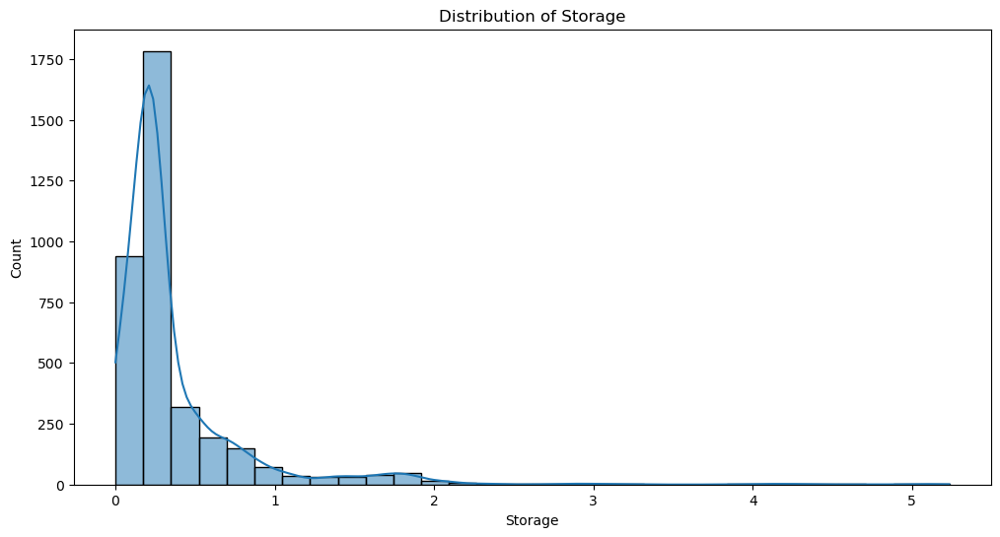

In [13]:
plt.figure(figsize=(12,6))
sns.histplot(data['Storage'],kde=True,bins=30)
plt.title('Distribution of Storage')

C:\Users\tomar\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


Text(0.5, 1.0, 'Distribution of Level')

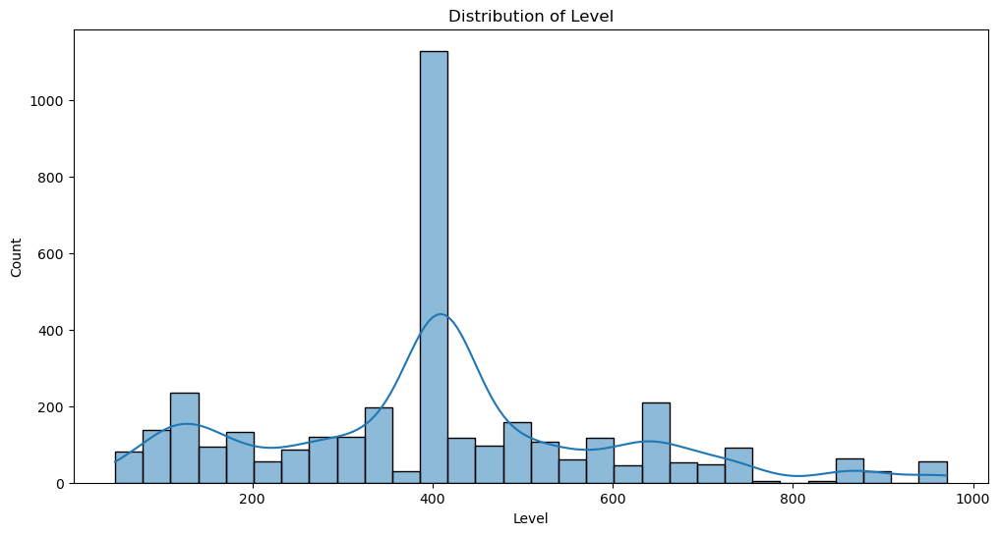

In [14]:
plt.figure(figsize=(12,6))
sns.histplot(data['Level'],kde=True,bins=30)
plt.title('Distribution of Level')

C:\Users\tomar\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\tomar\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\tomar\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\tomar\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating

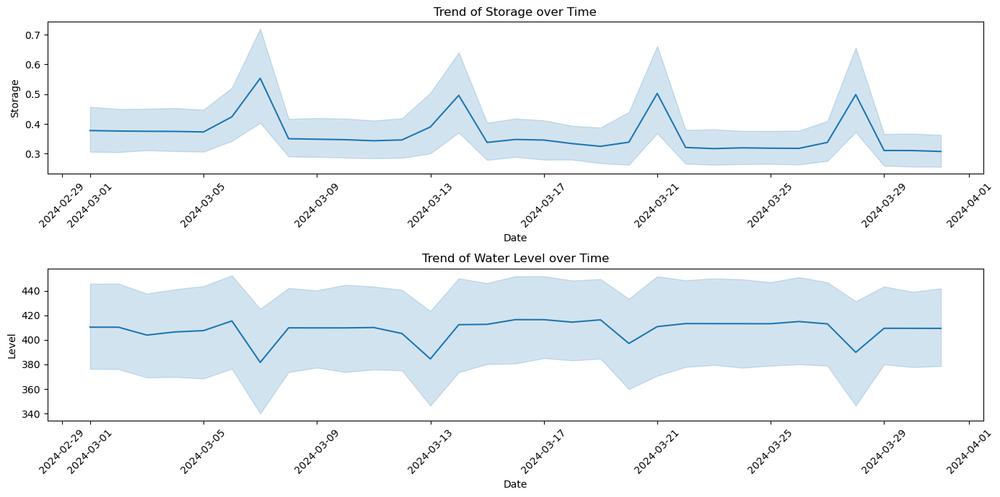

In [18]:
plt.figure(figsize=(14,7))
plt.subplot(2,1,1)
sns.lineplot(x='Date',y='Storage',data=data)
plt.xticks(rotation=45)
plt.title('Trend of Storage over Time')

plt.subplot(2,1,2)
sns.lineplot(x='Date',y='Level',data=data)
plt.xticks(rotation=45)
plt.title('Trend of Water Level over Time')
plt.tight_layout()
plt.show()

In [19]:
basin_storage_level = data.groupby('Basin').agg({
    'Storage':'mean',
    'Level':'mean'
}).reset_index()

In [20]:
basin_storage_level

,Basin,Storage,Level
0,Barak and Others Basin,0.216226,367.233131
1,Brahamaputra Basin,0.188387,308.761290
2,Brahmani and Baitarni Basin,0.393557,363.494524
3,Cauvery Basin,0.261573,614.488072
4,East flowing rivers between Mahanadi and Penna...,0.212522,364.999227
5,East flowing rivers between Pennar and Kanyaku...,0.140827,290.062251
6,Ganga Basin,0.391963,294.569707
7,Godavari Basin,0.344477,449.338386
8,Indus (Up to border) Basin,0.812289,508.998815
9,Krishna Basin,0.352752,531.970033


Text(0.5, 1.0, 'Average Storage by Basin')

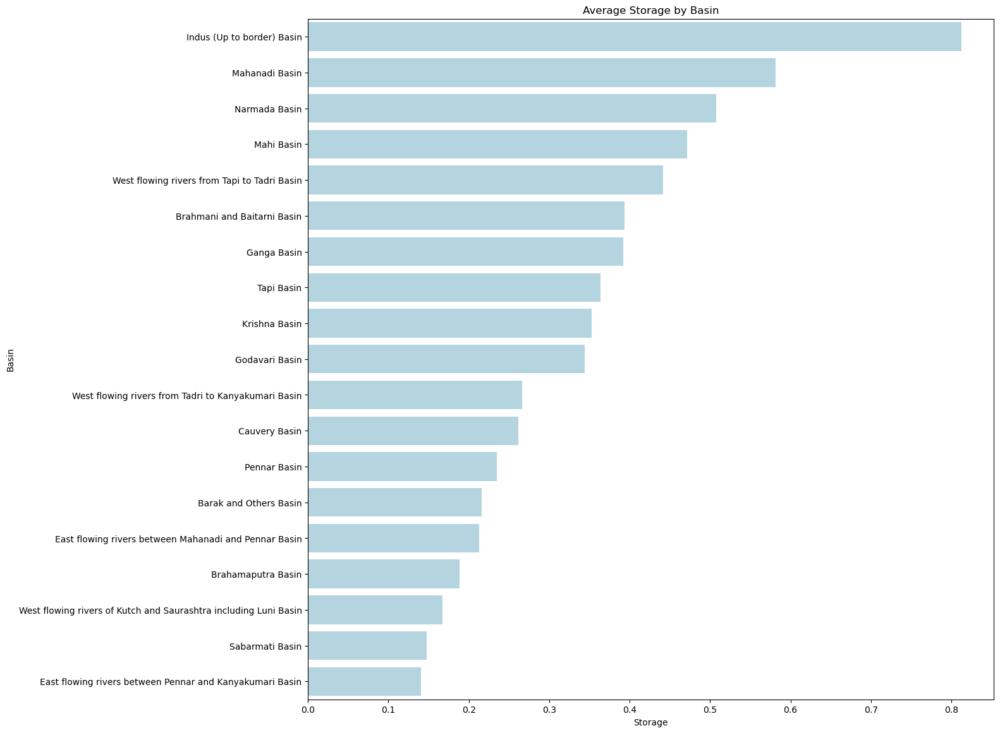

In [23]:
plt.figure(figsize=(14,14))
sns.barplot(x='Storage',y='Basin',data=basin_storage_level.sort_values('Storage',ascending=False),color='lightblue')
plt.title('Average Storage by Basin')

Text(0.5, 1.0, 'Average Water Level by Basin')

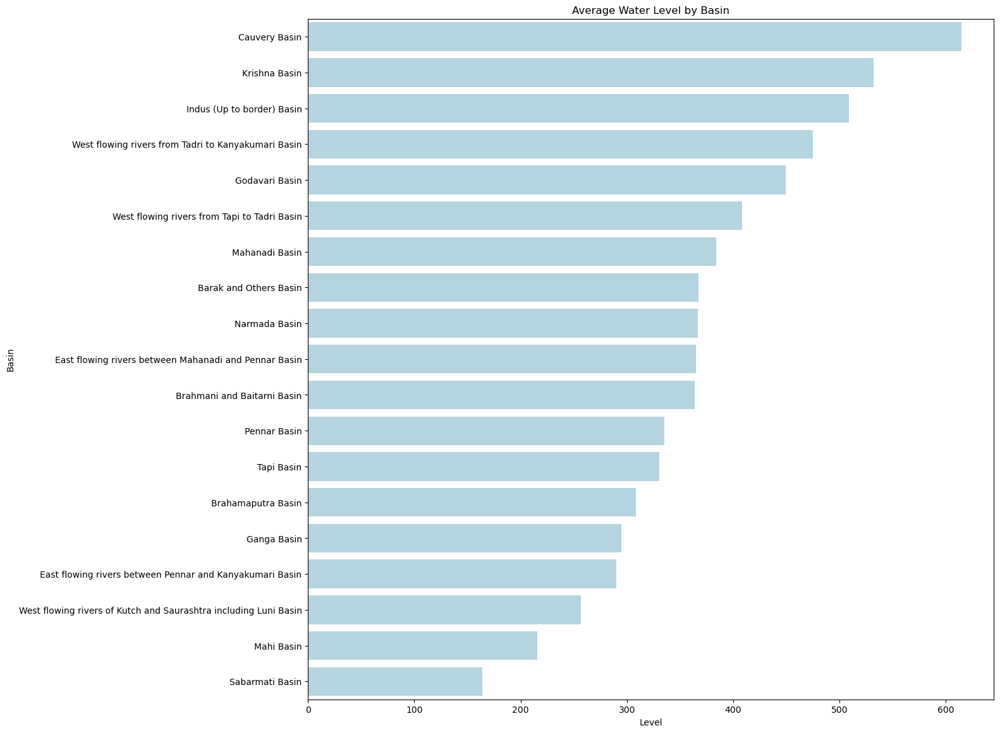

In [24]:
plt.figure(figsize=(14,14))
sns.barplot(x='Level',y='Basin',data=basin_storage_level.sort_values('Level',ascending=False),color='lightblue')
plt.title('Average Water Level by Basin')

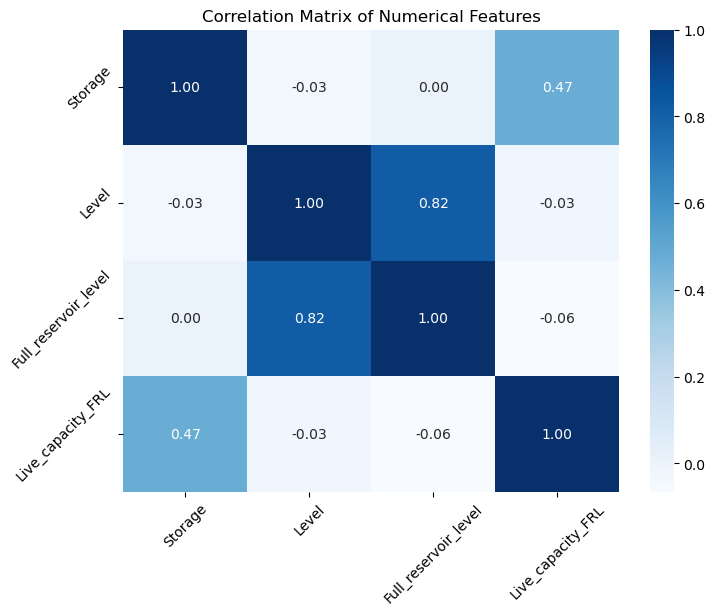

In [28]:
corr_matrix=data[['Storage','Level','Full_reservoir_level','Live_capacity_FRL']].corr()
plt.figure(figsize=(8,6))
sns.heatmap(corr_matrix,annot=True,cmap='Blues',fmt='.2f')
plt.title('Correlation Matrix of Numerical Features')
plt.xticks(rotation=45)
plt.yticks(rotation=45)
plt.show()

In [29]:
fig = px.scatter_geo(data,
                     lat='Lat',
                     scope='asia',
                     lon='Long',
                     color='Basin',
                     center=dict(lat=20.5937, lon=78.9629),
                     hover_name='Reservoir_name',
                    # hover_data={'Lat': False, 'Long': False, 'Storage': True, 'Level': True},
                     size='Storage',
                     projection='robinson',
                     title='Map of Reservoir Locations by River Basin with Storage Information')
fig.show()

In [30]:
data['Normalized_Storage'] = (data['Storage'] - data['Storage'].min()) / (data['Storage'].max() - data['Storage'].min())
min_radius = 3  # Minimum radius size
max_radius = 10  # Maximum radius size

# Create a base map centered around the average coordinates
base_map2 = folium.Map(location=[data['Lat'].mean(), data['Long'].mean()], zoom_start=5, tiles='cartodbpositron')

# Add scatter points with dynamic radius based on storage
for idx, row in data.iterrows():
    radius = row['Normalized_Storage'] * (max_radius - min_radius) + min_radius
    folium.CircleMarker(
        location=[row['Lat'], row['Long']],
        radius=radius,  # Dynamic radius for each marker
        popup=f"Reservoir: {row['Reservoir_name']}<br>Storage: {row['Storage']} MCM<br>Level: {row['Level']} meters",
        color='blue' if row['Storage'] > data['Storage'].median() else 'red',  # Color by storage: above median in blue, below in red
        fill=True,
        fill_opacity=0.7
    ).add_to(base_map2)

In [31]:
base_map2